In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import seaborn as sns
from datetime import date, datetime
from pandas_profiling import ProfileReport
import os
import glob
import pandas as pd

###Download Data from LA Metro and NOAA
#Update below and uncomment 

# os.chdir("<insert path name>")
# extension = 'csv'
# all_filenames = [i for i in glob.glob('*.{}'.format(extension))]
# #combine all files in the list
# combined_csv = pd.concat([pd.read_csv(f) for f in all_filenames ])
# #export to csv
# combined_csv.to_csv( "Metro_bike_combined.csv", index=False, encoding='utf-8-sig')


#path_metro = '<insert path name>.Metro_bike_combined_v2.csv'
#path_metro2 = '<insert path name>.Metro_bike_combined_v2_pt2.csv'
#path_weather = '<insert weather path name>.Weather LAX.csv'  

In [2]:
#import and explore data
data = pd.read_csv(path_metro)
data2 = pd.read_csv(path_metro2)
data = pd.concat([data, data2])
weather_data = pd.read_csv(path_weather)
data.tail()

In [20]:
bike_id = Weather_Metro_Combined_2019['bike_id']
bike_id = bike_id.unique()
bike_id2018 = Weather_Metro_Combined_2018['bike_id']
bike_id2018 = bike_id2018.unique()

print('Number of unique bikes 2019: ' + str(bike_id.shape[0]))
print('Number of unique bikes 2018: ' + str(bike_id2018.shape[0]))

Number of unique bikes 2019: 4483
Number of unique bikes 2018: 1444


In [22]:
#Create Date from Start date

def create_date(data):#, year):
    data['DATE'] = pd.DatetimeIndex(data['start_time']).date
    return data

data = create_date(data)

In [23]:
data.tail()

,trip_id,duration,start_time,end_time,start_station,start_lat,start_lon,end_station,end_lat,end_lon,bike_id,plan_duration,trip_route_category,passholder_type,bike_type,season,Year,DATE
53645,112536055,9,12/31/18 23:46,12/31/18 23:55,3069.0,34.050880,-118.248253,3069.0,34.050880,-118.248253,6222,1.0,Round Trip,Walk-up,standard,winter,NaN,2018-12-31
53646,112536054,7,12/31/18 23:47,12/31/18 23:54,3069.0,34.050880,-118.248253,3069.0,34.050880,-118.248253,5730,1.0,Round Trip,Walk-up,standard,winter,NaN,2018-12-31
53647,112540414,97,12/31/18 23:51,1/1/19 1:28,4211.0,33.984928,-118.469963,4210.0,33.984341,-118.471550,12347,1.0,One Way,Walk-up,standard,winter,NaN,2018-12-31
53648,112537256,28,12/31/18 23:54,1/1/19 0:22,3005.0,34.048500,-118.258537,3082.0,34.046520,-118.237411,12128,1.0,One Way,Walk-up,standard,winter,NaN,2018-12-31
53649,112537255,26,12/31/18 23:56,1/1/19 0:22,3005.0,34.048500,-118.258537,3082.0,34.046520,-118.237411,12017,1.0,One Way,Walk-up,standard,winter,NaN,2018-12-31


# combine with the weather data

In [24]:
#Convert date format, retain only needed columns from weather, merge data function

#Convert to datetime
def convert_datetime(data):
    data['DATE'] = pd.to_datetime(data['DATE'])
    return data

#Drop everything from weather but DATE, TAVG, TMAX, TMIN, AWND, PRCP
def Rel_Columns(data):
    data = data[["DATE", "TAVG", "TMAX", "TMIN", "AWND", "PRCP"]]
    return data

#merge on DATE
def merge_data(data1, data2):
    data = pd.merge(data1, data2, on='DATE', how = 'left')
    return data


#all data merge
data = convert_datetime(data)
weather_data = convert_datetime(weather_data)
weather_data = Rel_Columns(weather_data)
Weather_Metro_Combined = merge_data(data, weather_data)

In [25]:
Weather_Metro_Combined.head()

,trip_id,duration,start_time,end_time,start_station,start_lat,start_lon,end_station,end_lat,end_lon,...,passholder_type,bike_type,season,Year,DATE,TAVG,TMAX,TMIN,AWND,PRCP
0,118571839,7,2019-04-01 00:02:00,2019-04-01 00:09:00,3069.0,34.050880,-118.248253,3034.0,34.042061,-118.263382,...,Walk-up,standard,spring,2019.0,2019-04-01,69.0,81,60,6.49,0.0
1,118574695,12,2019-04-01 00:56:00,2019-04-01 01:08:00,3031.0,34.044701,-118.252441,4311.0,34.059689,-118.294662,...,Monthly Pass,standard,spring,2019.0,2019-04-01,69.0,81,60,6.49,0.0
2,118575167,12,2019-04-01 01:06:00,2019-04-01 01:18:00,3038.0,34.046822,-118.248352,3082.0,34.046520,-118.237411,...,Walk-up,standard,spring,2019.0,2019-04-01,69.0,81,60,6.49,0.0
3,118577060,48,2019-04-01 01:08:00,2019-04-01 01:56:00,3068.0,34.053200,-118.250954,3005.0,34.048500,-118.258537,...,Monthly Pass,standard,spring,2019.0,2019-04-01,69.0,81,60,6.49,0.0
4,118575166,9,2019-04-01 01:09:00,2019-04-01 01:18:00,3038.0,34.046822,-118.248352,3082.0,34.046520,-118.237411,...,Walk-up,standard,spring,2019.0,2019-04-01,69.0,81,60,6.49,0.0


In [26]:
#prcp anything above 0 is rain
def Rain(data):
    data['Rain'] = [1 if x > 0 else 0 for x in data['PRCP']]
    return data

#mean wind is 7.4 maybe above that is windy below not windy
def Wind(data):
    data['Wind'] = [1 if x > 7.4 else 0 for x in data['AWND']]
    return data

#weekend or weekday    
def Weekend(data):
    data['Weekend'] = [1 if x.dayofweek > 4 else 0 for x in data['DATE']]
    return data

#temp
def temp(data):
    data['TAVG_65'] = [1 if x.TAVG > 65 else 0 for x in data['TAVG']]
    return data

Weather_Metro_Combined = Rain(Weather_Metro_Combined)
Weather_Metro_Combined = Wind(Weather_Metro_Combined)
Weather_Metro_Combined = Weekend(Weather_Metro_Combined)

In [27]:
import numpy as np
from datetime import date
import datetime
#Weather_Metro_Combined
Weather_Metro_Combined['AWND'] = Weather_Metro_Combined['AWND'].round()
Weather_Metro_Combined['Avg. Temp Range'] = Weather_Metro_Combined['TMAX'] - Weather_Metro_Combined['TMIN']

Weather_Metro_Combined = Weather_Metro_Combined.drop(['trip_id', 'season', 'trip_route_category', 'passholder_type', 'bike_type',  'start_time', 'end_time', 'start_station', 'start_lat', 'start_lon', 'end_station', 'end_lat', 'end_lon', 'bike_id','plan_duration','Year'], axis=1)
Weather_Metro_Combined['Count_of_Trip_Id'] = Weather_Metro_Combined.DATE.map(Weather_Metro_Combined.groupby('DATE').size())

#Get average duration
Weather_Metro_Combined_duration = Weather_Metro_Combined[['DATE','duration']] 
Weather_Metro_Combined_duration = Weather_Metro_Combined_duration.groupby(['DATE']).mean()
Weather_Metro_Combined_duration.reset_index(inplace=True)

#merge average duration back to primary dataset
Weather_Metro_Combined = merge_data(Weather_Metro_Combined, Weather_Metro_Combined_duration)
Weather_Metro_Combined = Weather_Metro_Combined.rename(columns={'duration_y': 'Avg. Duration', })
Weather_Metro_Combined = Weather_Metro_Combined.drop(['duration_x'], axis = 1)
Weather_Metro_Combined = Weather_Metro_Combined.drop_duplicates()

In [28]:
#Subset year

def filter_year(data, year):
    data['Year'] = pd.DatetimeIndex(data['DATE']).year
    data = data[data["Year"] == year]
    return data

Weather_Metro_Combined_2016 = filter_year(Weather_Metro_Combined, 2016)
Weather_Metro_Combined_2017 = filter_year(Weather_Metro_Combined, 2017)
Weather_Metro_Combined_2018 = filter_year(Weather_Metro_Combined, 2018)
Weather_Metro_Combined_2019 = filter_year(Weather_Metro_Combined, 2019)

#Weather_Metro_Combined_2017_2018 = pd.concat([Weather_Metro_Combined_2018, Weather_Metro_Combined_2017])


In [29]:
#Change this to change the year of data we want to use
data_agg = Weather_Metro_Combined_2018

#create 2017-2018 combined dataset and 2019 dataset
#data_agg = Weather_Metro_Combined_2017_2018
data_agg2019 = Weather_Metro_Combined_2019
data_agg2018 = Weather_Metro_Combined_2018

In [30]:
Weather_Metro_Combined_2018['Count_of_Trip_Id'].describe()

count     365.000000
mean      854.504110
std       201.605992
min       227.000000
25%       726.000000
50%       860.000000
75%       970.000000
max      2494.000000
Name: Count_of_Trip_Id, dtype: float64

In [31]:
%load_ext autoreload
%autoreload 2
from preprocessing_bike import Preprocess_bike

test = Preprocess_bike()

In [1]:
data_agg = test.fit_transform(data_agg)
data_agg2019 = test.fit_transform(data_agg2019)
data_agg2018 = test.fit_transform(data_agg2018)

#original 2018 data
Weather_Metro_Combined_2018 = test.fit_transform(Weather_Metro_Combined_2018)


In [33]:
#Get Sum for Month 
def month_count(data):
    Month_count = data.groupby('Month').sum()
    Month_count = Month_count['Count_of_Trip_Id']
    Month_count = pd.DataFrame(Month_count)
    Month_count = Month_count.rename(columns = {'Count_of_Trip_Id': 'Month_Count_of_Trip_Id'})
    data = pd.merge(data, Month_count, left_on='Month', right_on ='Month', how = 'left')
    return data

data_agg = month_count(data_agg)
data_agg2018 = month_count(data_agg2018)
data_agg2019 = month_count(data_agg2019)

In [34]:
prof = ProfileReport(data_agg2018)
prof.to_notebook_iframe()

In [35]:
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(data_agg, test_size=0.3, random_state=42)

def get_day_Xy(df):
    # Feel free to extract features from the release_date if you want (ie. the month), just don't use the year
    X = df.drop(['Count_of_Trip_Id', 'DATE','Year', 'count_z_score', 'Month_Count_of_Trip_Id'], axis=1)
    #X = df[['TAVG','TMAX', 'TMIN', 'Day_of_Year']]
    y = df['Count_of_Trip_Id']
   
    
    return X, y

X_train, y_train = get_day_Xy(df_train)
X_test, y_test = get_day_Xy(df_test)
data_agg2019_X, data_agg2019_y = get_day_Xy(data_agg2019)
data_agg2018_X, data_agg2018_y = get_day_Xy(data_agg2018)
#data_agg_X, data_agg_y = get_day_Xy(data_agg)

In [36]:
X_train.columns

Index(['TAVG', 'TMAX', 'TMIN', 'AWND', 'PRCP', 'Rain', 'Wind', 'Weekend',
       'Avg. Temp Range', 'Avg. Duration', 'Day_of_Week', 'Day_of_Year',
       'Month', 'winter', 'spring', 'summer', 'autumn', 'holiday', 'Month_1',
       'Month_2', 'Month_3', 'Month_4', 'Month_5', 'Month_6', 'Month_7',
       'Month_8', 'Month_9', 'Month_10', 'Month_11', 'Month_12',
       'day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3',
       'day_of_week_4', 'day_of_week_5', 'day_of_week_6'],
      dtype='object')

## Random Forest Regressor

In [37]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error

rf = RandomForestRegressor(random_state=42)
pipe_with_custom_preprocess_rf = Pipeline([('clf', rf)])
pipe_with_custom_preprocess_rf.fit(X_train, y_train)

y_pred = pipe_with_custom_preprocess_rf.predict(X_test)
#val_error = mean_squared_error(y_test, y_pred)  
#print("MSE:", val_error)

In [38]:
from sklearn.metrics import mean_squared_error, r2_score, max_error

def report_regression_metrics(model, X, y, plots=False):
    y_pred = model.predict(X)
    if plots:
        plt.figure()
        sns.distplot(y - y_pred) # plot distribution of errors
        plt.figure()
        sns.scatterplot(x=y, y=y_pred)
        
    print("MSE:", mean_squared_error(y, y_pred))
    print("R2 score:", r2_score(y, y_pred))
    print("Max error:", max_error(y, y_pred))
    print() # blank line

In [39]:

print("Train metrics:")
report_regression_metrics(rf, X_train, y_train)


print("Test metrics:")
report_regression_metrics(rf, X_test, y_test)

Train metrics:
MSE: 3163.266338431373
R2 score: 0.9264607164176639
Max error: 476.45000000000005

Test metrics:
MSE: 12530.835167272728
R2 score: 0.6346359351933282
Max error: 497.27



## Logistic regression

In [3]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

log_clf = LogisticRegression(solver="lbfgs", random_state=42)
log_clf.fit(X_train, y_train)
y_pred = log_clf.predict(X_train)
print(log_clf.__class__.__name__, accuracy_score(y_train, y_pred))

## Grid Search

In [41]:
%%time
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import TimeSeriesSplit
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor


param_search = {
       
    
    'clf__max_depth' : [3, 5, 10, 25]#,50],
    
}


pipe = Pipeline([('clf', rf)]) 



tscv = TimeSeriesSplit(n_splits= 8)# 25) #this will break the data temporally according to https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.TimeSeriesSplit.html

# Using the temporal splits, we can learn the parameters using grid search.
gsearch = GridSearchCV(estimator=pipe, cv=tscv,
                        param_grid=param_search, scoring='r2')

gsearch.fit(X_train, y_train);

print("Best parameter (CV score=%0.3f):" % gsearch.best_score_)

Best parameter (CV score=0.459):
CPU times: user 7.87 s, sys: 165 ms, total: 8.03 s
Wall time: 9.36 s


In [42]:
def print_regression_report(y_true, y_pred):
    print(f"r2 score: {r2_score(y_true, y_pred)}")
    print(f"mse: {mean_squared_error(y_true, y_pred)}")


print_regression_report(y_train, gsearch.predict(X_train)
)
print_regression_report(y_test, gsearch.predict(X_test)
)

r2 score: 0.9264607164176639
mse: 3163.266338431373
r2 score: 0.6346359351933282
mse: 12530.835167272728


## Xgboost

In [43]:
%%time
import xgboost
xgb_reg = xgboost.XGBRegressor(random_state=42, learning_rate=.5)
xgb_reg.fit(X_train, y_train)
y_pred = xgb_reg.predict(X_train)
val_error = mean_squared_error(y_train, y_pred) 
print("Validation MSE:", val_error) 

Validation MSE: 0.000351915917560166
CPU times: user 1.5 s, sys: 168 ms, total: 1.66 s
Wall time: 1.65 s


In [44]:
print('Xgboost:')                        
print_regression_report(y_test, xgb_reg.predict(X_test))

Xgboost:
r2 score: 0.5804202117862434
mse: 14390.263498978284


## Voting Classifier

In [45]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostRegressor

log_clf = LogisticRegression(solver="lbfgs", random_state=42)
rnd_clf = RandomForestClassifier(n_estimators=8, random_state=42)
svm_clf = SVC(gamma="scale", random_state=42)


voting_clf = VotingClassifier(
    estimators=[('lr', log_clf), ('rf', rnd_clf), ('svc', svm_clf)],
    voting='hard')

In [4]:
from sklearn.metrics import accuracy_score

for clf in (log_clf, rnd_clf, svm_clf, voting_clf):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_train)
    print(clf.__class__.__name__, accuracy_score(y_train, y_pred))

## Adaboost

In [47]:
from sklearn.ensemble import AdaBoostRegressor

ada_clf = AdaBoostRegressor(
     learning_rate=1.5, random_state=42)
ada_clf.fit(X_train, y_train)
y_pred = ada_clf.predict(X_train)

print('AdaBoost:')                        
print_regression_report(y_test, ada_clf.predict(X_test))

AdaBoost:
r2 score: 0.5745505280174439
mse: 14591.575140914832


In [48]:
print('AdaBoost:')                        
print_regression_report(y_test, ada_clf.predict(X_test))
print('\n')
print('XGBoost:')
y_pred = xgb_reg.predict(X_train)
val_error = mean_squared_error(y_train, y_pred) 
print("Validation MSE:", val_error) 
print('\n')
print('GridSearch:')
print_regression_report(y_test, gsearch.predict(X_test)
)

AdaBoost:
r2 score: 0.5745505280174439
mse: 14591.575140914832


XGBoost:
Validation MSE: 0.000351915917560166


GridSearch:
r2 score: 0.6346359351933282
mse: 12530.835167272728


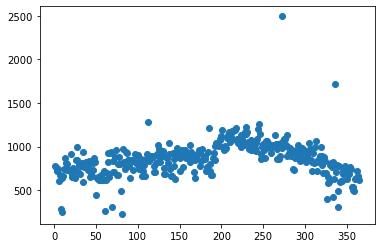

In [49]:
import matplotlib.pyplot as plt
x = data_agg['Day_of_Year']
y = data_agg['Count_of_Trip_Id']
plt.plot(x, y, 'o')

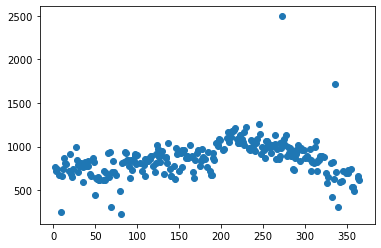

In [50]:

x = X_train['Day_of_Year']
#plt.plot(x, y, 'o')
plt.plot(x, y_pred, 'o')

In [51]:
print(y_pred[194])
print(data_agg.iloc[194][10])

796.00006
813


In [52]:
y_pred_rnd = rnd_clf.predict(data_agg2019_X)
y_pred_rf = rf.predict(data_agg2019_X)
y_pred_xgb = xgb_reg.predict(data_agg2019_X)
y_pred_ada = ada_clf.predict(data_agg2019_X)
y_pred_log = log_clf.predict(data_agg2019_X)
y_pred_vot = voting_clf.predict(data_agg2019_X)
y_pred_grd = gsearch.predict(data_agg2019_X)

# 2019 Predictions Using 2018 trained data

### Random Forest Regressor

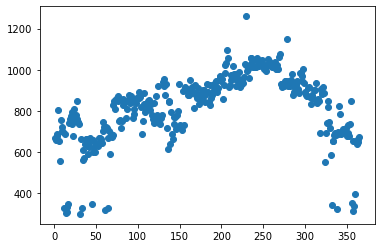

In [53]:
x = data_agg2019_X['Day_of_Year']
plt.plot(x, y_pred_rf, 'o')

In [54]:
print("Test metrics:")
report_regression_metrics(rf, data_agg2019_X, data_agg2019_y)

Test metrics:
MSE: 27560.371319178084
R2 score: 0.49002138512614457
Max error: 1174.71



### Random Forest Classifier

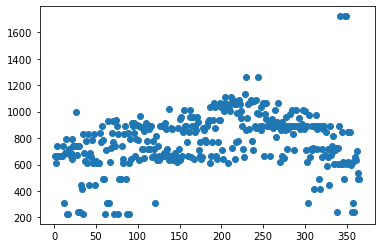

In [55]:
x = data_agg2019_X['Day_of_Year']
plt.plot(x, y_pred_rnd, 'o')

In [56]:
print('Rnd_Clf:')  
print_regression_report(data_agg2019_y, rnd_clf.predict(data_agg2019_X))

Rnd_Clf:
r2 score: -0.17072517073601912
mse: 63268.57534246575


### XGboost

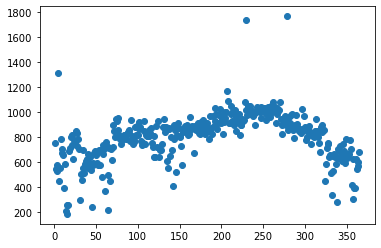

In [57]:
x = data_agg2019_X['Day_of_Year']
plt.plot(x, y_pred_xgb, 'o')

In [58]:
print('Xgboost:')                        
print_regression_report(data_agg2019_y, xgb_reg.predict(data_agg2019_X))

Xgboost:
r2 score: 0.44955923029498923
mse: 29747.035581162


### Adaboost

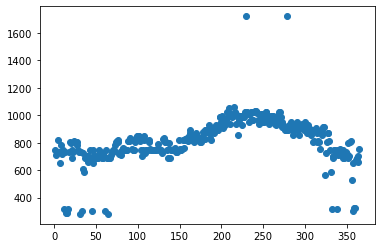

In [59]:
x = data_agg2019_X['Day_of_Year']
plt.plot(x, y_pred_ada, 'o')

In [60]:
print('AdaBoost:')                        
print_regression_report(data_agg2019_y, ada_clf.predict(data_agg2019_X))

AdaBoost:
r2 score: 0.5706485571483968
mse: 23203.100769905814


### Logistic Regression

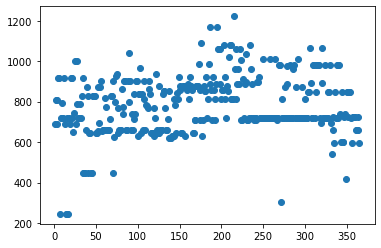

In [61]:
x = data_agg2019_X['Day_of_Year']
plt.plot(x, y_pred_log, 'o')

In [62]:
print('Logistic Regression:')
print_regression_report(data_agg2019_y, log_clf.predict(data_agg2019_X))

Logistic Regression:
r2 score: -0.043900053678994855
mse: 56414.665753424655


### Voting Classifier

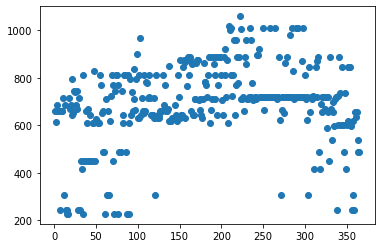

In [63]:
x = data_agg2019_X['Day_of_Year']
plt.plot(x, y_pred_vot, 'o')

In [64]:
print('Voting Classifier:')
print_regression_report(data_agg2019_y, voting_clf.predict(data_agg2019_X))

Voting Classifier:
r2 score: -0.10463421367847414
mse: 59696.87397260274


### Grid Search

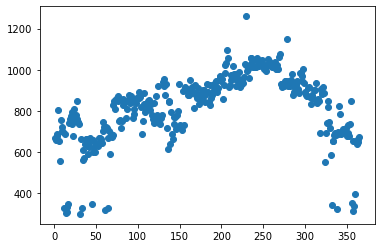

In [65]:
x = data_agg2019_X['Day_of_Year']
plt.plot(x, y_pred_grd, 'o')

In [66]:
print('Grid Search:')
print_regression_report(data_agg2019_y, gsearch.predict(data_agg2019_X))

Grid Search:
r2 score: 0.49002138512614457
mse: 27560.371319178084


### Actual 2019 Outcome

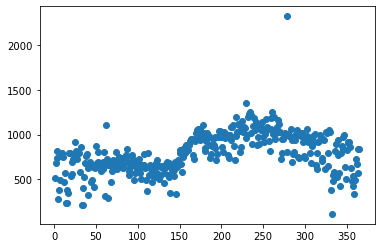

In [67]:
x = Weather_Metro_Combined_2019['Day_of_Year']
y = Weather_Metro_Combined_2019['Count_of_Trip_Id']
plt.plot(x, y, 'o')

### Actual 2018 Outcome

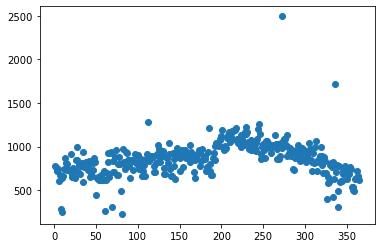

In [68]:
#original 2018 data sanity check
x = Weather_Metro_Combined_2018['Day_of_Year']
y = Weather_Metro_Combined_2018['Count_of_Trip_Id']
plt.plot(x, y, 'o')